In [152]:
#libraries and necessary packages
#visualization
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import pyLDAvis
import pyLDAvis.sklearn

#basic
import string
import numpy as np
import pandas as pd
import multidict as multidict

#document processing
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords
import nltk
nltk.download('wordnet')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import regex as re
import nltk.data
import re
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
from nltk.stem import WordNetLemmatizer
from nltk import word_tokenize, sent_tokenize, pos_tag
from sklearn.feature_extraction.text import CountVectorizer


#sentiment analysis
!pip install text2emotion
import text2emotion as te

#Topic modeling
from sklearn.decomposition import LatentDirichletAllocation

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/dafnepelagiepapaefthymiou/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/dafnepelagiepapaefthymiou/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/dafnepelagiepapaefthymiou/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [153]:
dataset_path = 'Downloads/philosophy_data.csv'
dataset = pd.read_csv(dataset_path , low_memory=False)

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Data exploration


In [227]:
#exploration of number of different books, schools, and timeline of publications
df_book =  dataset.groupby(['title']).size().reset_index(name='counts')#to get df instead of series
df_school_title =  dataset.groupby(['school','title']).size().reset_index(name='counts')
df_school = dataset.groupby(['school']).size().reset_index(name='counts')

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


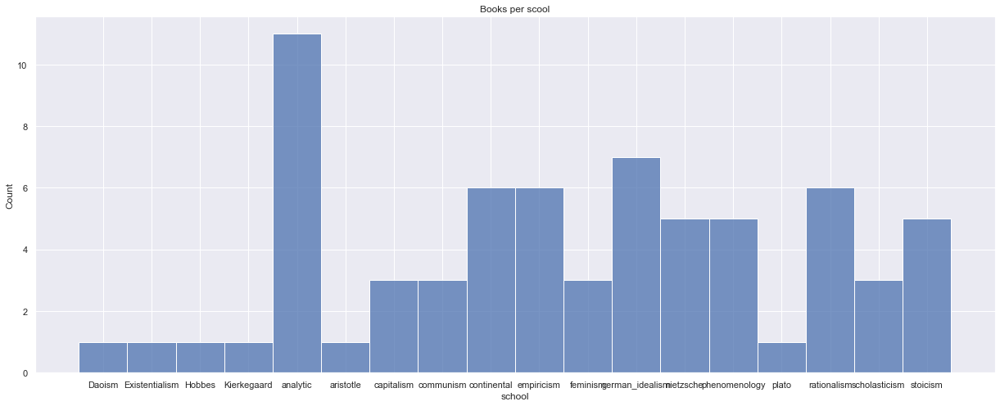

In [252]:
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above) 
sns.set(style="darkgrid")
sns.set(rc = {'figure.figsize':(21,8)})
sns.histplot(data=df_school_title, x="school" )
plt.title('Books per scool')
plt.show()

In [158]:
df_timeline =  dataset.groupby(['title','original_publication_date','school']).size().reset_index(name='counts')#to get df instead of series
df_timeline.sort_values(by=['original_publication_date'])

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


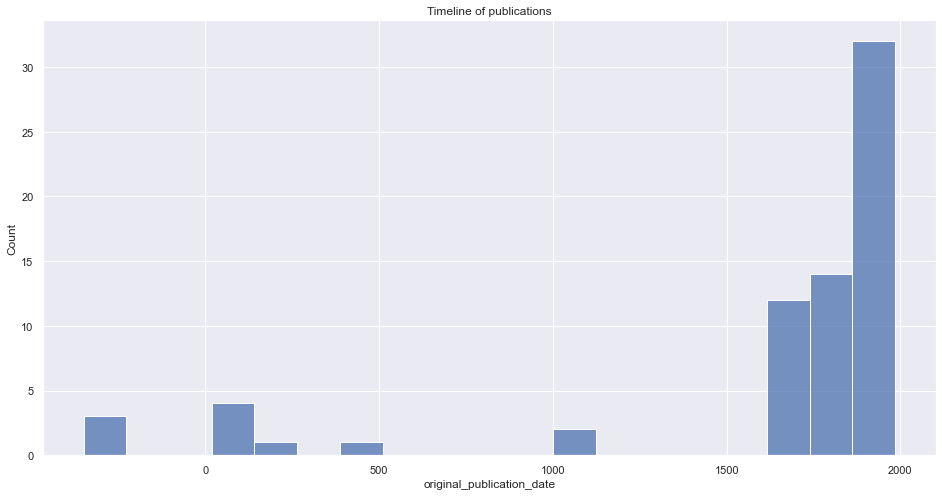

In [253]:
#observe the timeline of publications
sns.set(style="darkgrid")
sns.set(rc = {'figure.figsize':(16,8)})
sns.histplot(data=df_timeline, x="original_publication_date" )
plt.title('Timeline of publications')
plt.show()

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Text(0, 0.5, '')]

Exception ignored in: <function SeekableUnicodeStreamReader.__del__ at 0x121e4e430>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/nltk/data.py", line 1159, in __del__
    if not self.closed:
  File "/opt/anaconda3/lib/python3.8/site-packages/nltk/data.py", line 1173, in closed
    return self.stream.closed
AttributeError: 'SeekableUnicodeStreamReader' object has no attribute 'stream'


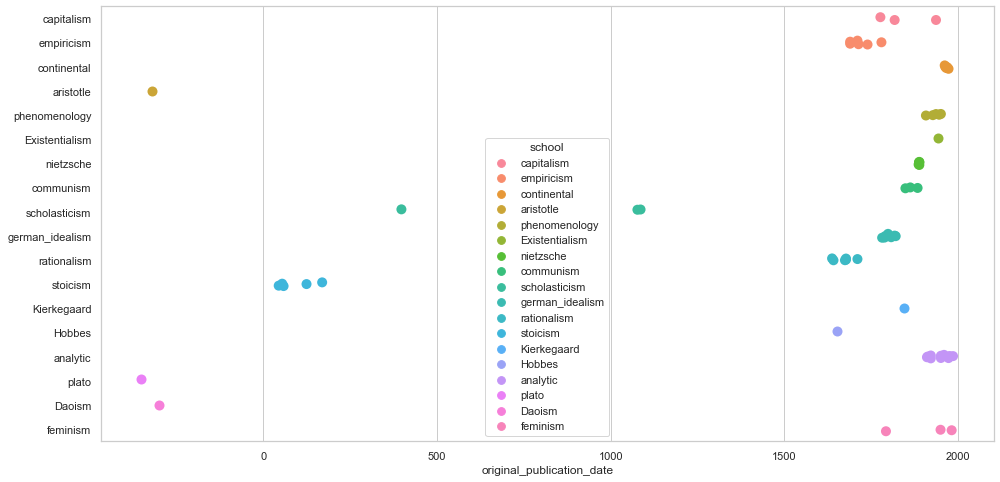

In [254]:
#Timeline of publications per school
sns.set_theme(style="whitegrid", palette="muted")
ax = sns.stripplot(data=df_timeline,
    x= "original_publication_date", y="school", hue="school" , s=10)
ax.set(ylabel="")

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-255-47bdf7969f5b>:5: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  mean_df = dataset_sorted.groupby("school")['sentence_length2' , 'original_publication_date' ].mean()


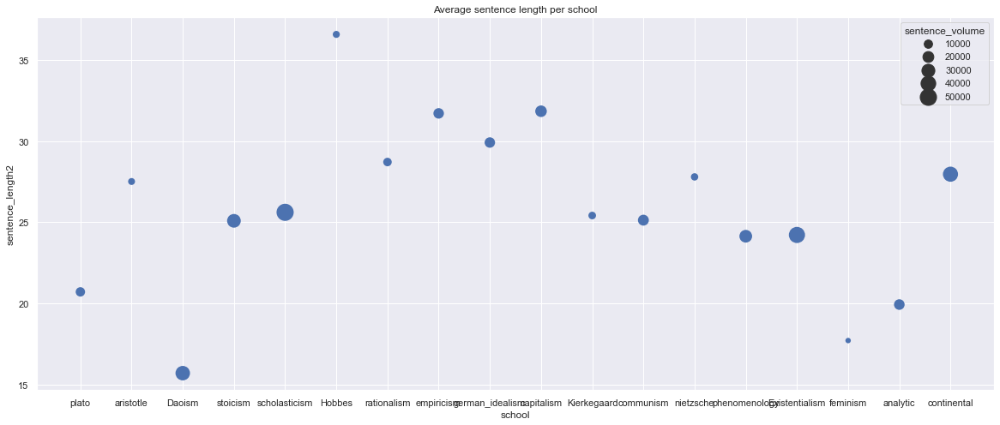

In [255]:
#sentence length visualization, we create our own sentence_length2 column since we discovered that the initial dataset column is inconsistent
dataset['sentence_length2'] = dataset['tokenized_txt'].apply(lambda sentence_str: len(sentence_str.split()))
dataset_sorted = dataset.sort_values(by=['original_publication_date'])
#fing avg sentence length per school
mean_df = dataset_sorted.groupby("school")['sentence_length2' , 'original_publication_date' ].mean()
mean_df = mean_df.reset_index()
#sort chronologically
mean_df = mean_df.sort_values(by=['original_publication_date'])
#sort the dataframe that contains information about the amount of sentences per school also chronologically
df_school = df_school.set_index('school')
df_school = df_school.reindex(index=mean_df['school'])
df_school = df_school.reset_index()
#add to our mean dataset the amount of sentences per school
mean_df['sentence_volume'] = df_school['counts']
#plot
sns.set(style="darkgrid")
sns.set(rc = {'figure.figsize':(20,8)})
mean_df
sns.scatterplot(y=mean_df['sentence_length2'], x=mean_df['school'],
                palette="ch:r=-.2,d=.3_r",
                sizes=(40, 400), linewidth=0 , size = mean_df['sentence_volume']  )
plt.title('Average sentence length per school')
plt.savefig('Average sentence length per school.png')
plt.show()
chronological_order = mean_df['school'].values.tolist()

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


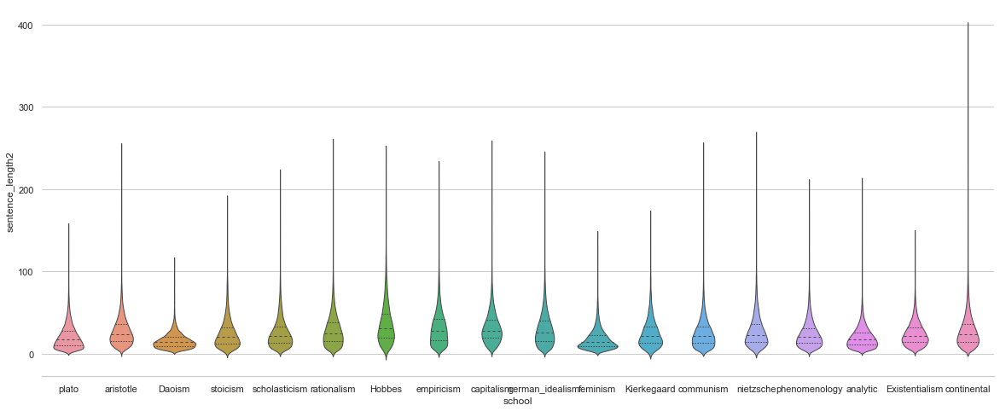

In [256]:
#plot violionplots to investigate sentence length distributions
sns.set_theme(style="whitegrid")
sns.violinplot(data=dataset_sorted, y=dataset_sorted['sentence_length2'], x=dataset_sorted['school'], 
               split=False, inner="quart", linewidth=1)
sns.despine(left=True)

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


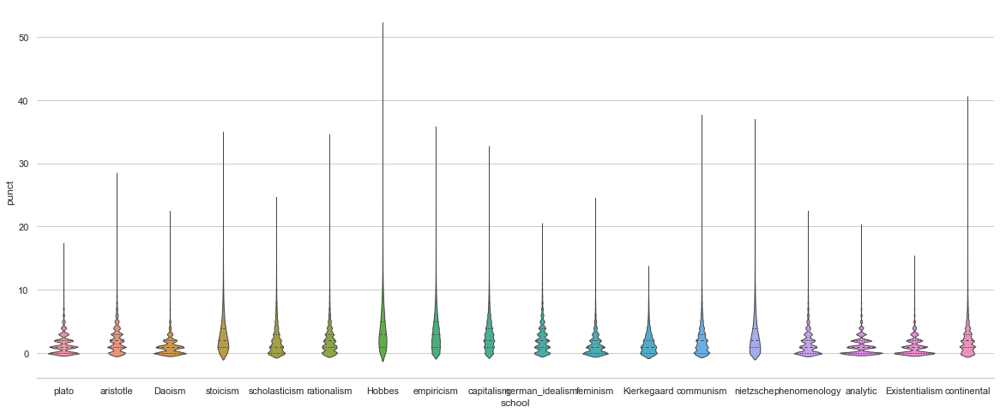

In [257]:
#punctiation symbol count in each sentence
dataset['commas'] = dataset['sentence_str'].apply(lambda x: x.count(','))
dataset['quest'] = dataset['sentence_str'].apply(lambda x: x.count(';'))
dataset['punct'] = dataset['commas'] + dataset['quest']
dataset_sorted2 = dataset.sort_values(by=['original_publication_date'])
#plot
sns.set_theme(style="whitegrid")
sns.violinplot(data=dataset_sorted2, y=dataset_sorted2['punct'], x=dataset_sorted2['school'], 
               split=False, inner="quart", linewidth=1)
sns.despine(left=True)

# Data processing

In [173]:
#pipeline for preprocessing the sentences each function is named appropriately and is defined separately 
def preprocess_text(text):
    text = remove_numbers(text)
    text = remove_punctuation(text)
    text = convert_to_lower(text)
    text = remove_white_space(text)
    trans_table={ord(c):None for c in string.punctuation+string.digits}
    text = tokenize(text, trans_table)
    return text

def convert_to_lower(text):
  return text.lower()

def remove_numbers(text):
  text = re.sub(r'\d+' , '', text)
  return text

def remove_punctuation(text):
     punctuations = '''!()[]{};«№»:'"\,`<>./?@=#$-(%^)+&[*_]~'''
     no_punct = "" 
     for char in text:
        if char not in punctuations:
            no_punct = no_punct + char
     return no_punct

def remove_white_space(text):
  text = text.strip()
  return text

def tokenize(text, trans_table):
#we remove stop words both before and after lemmatization
    english_stemmer = PorterStemmer()
    text = text.lower()
    stops = stopwords.words('english')
    #additional stop words that we removed
    stops.extend(['go','sure','back','say','one','two','say','would','us', 'also' ,'dont' , 'another'                                                                                            
    'without','much','whose','therefor','first','within','yet','this', 'thing' , 'though' , 'may','often'])
    stop_words = set(stops)
    tokens= [world for world in nltk.word_tokenize(text.translate(trans_table)) if len(world)>1]
    tokens = [i for i in tokens if not i in stop_words]
    #lemmatizing words
    pos_map = {'J': 'a', 'N': 'n', 'R': 'r', 'V': 'v'}
    pos_tags_list = pos_tag(tokens)
    lemmatiser = WordNetLemmatizer()
    tokens = [lemmatiser.lemmatize(w.lower(), pos=pos_map.get(p[0], 'v')) for w, p in pos_tags_list]
    #again removal of stop words in the lemmatised text
    result = [i for i in tokens if not i in stop_words]
    return result

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<>:19: DeprecationWarning: invalid escape sequence \,
<>:19: DeprecationWarning: invalid escape sequence \,
<ipython-input-173-b6550635e38d>:19: DeprecationWarning: invalid escape sequence \,
  punctuations = '''!()[]{};«№»:'"\,`<>./?@=#$-(%^)+&[*_]~'''


In [174]:
dataset['sentence_cleaned2'] = dataset['sentence_str'].apply(lambda x: ' '.join(preprocess_text(x)))

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,title,author,school,sentence_spacy,sentence_str,original_publication_date,corpus_edition_date,sentence_length,sentence_lowered,tokenized_txt,lemmatized_str,sentence_length2,commas,quest,punct,sentence_cleaned2
0,Plato - Complete Works,Plato,plato,"What's new, Socrates, to make you leave your ...","What's new, Socrates, to make you leave your ...",-350,1997,125,"what's new, socrates, to make you leave your ...","['what', 'new', 'socrates', 'to', 'make', 'you...","what be new , Socrates , to make -PRON- lea...",23,2,0,2,whats new socrates make leave usual haunt lyce...
1,Plato - Complete Works,Plato,plato,Surely you are not prosecuting anyone before t...,Surely you are not prosecuting anyone before t...,-350,1997,69,surely you are not prosecuting anyone before t...,"['surely', 'you', 'are', 'not', 'prosecuting',...",surely -PRON- be not prosecute anyone before ...,12,0,0,0,surely prosecute anyone king archon
2,Plato - Complete Works,Plato,plato,The Athenians do not call this a prosecution b...,The Athenians do not call this a prosecution b...,-350,1997,74,the athenians do not call this a prosecution b...,"['the', 'athenians', 'do', 'not', 'call', 'thi...",the Athenians do not call this a prosecution ...,11,1,0,1,athenian call prosecution indictment euthyphro
3,Plato - Complete Works,Plato,plato,What is this you say?,What is this you say?,-350,1997,21,what is this you say?,"['what', 'is', 'this', 'you', 'say']",what be this -PRON- say ?,5,0,0,0,
4,Plato - Complete Works,Plato,plato,"Someone must have indicted you, for you are no...","Someone must have indicted you, for you are no...",-350,1997,101,"someone must have indicted you, for you are no...","['someone', 'must', 'have', 'indicted', 'you',...","someone must have indict -PRON- , for -PRON- ...",19,1,0,1,someone must indict tell indict someone else
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396422,The Book of Zhuangzi,Zhuangzi,Daoism,"Certainly, he can be credited with founding on...","Certainly, he can be credited with founding on...",-300,2006,134,NaN,"['certainly', 'he', 'can', 'be', 'credited', '...","certainly , -PRON- can be credit with found o...",25,2,0,2,certainly credit found school think honest nee...
396423,The Book of Zhuangzi,Zhuangzi,Daoism,Hui Shih found no sense of achievement in doin...,Hui Shih found no sense of achievement in doin...,-300,2006,53,NaN,"['hui', 'shih', 'found', 'no', 'sense', 'of', ...",Hui Shih find no sense of achievement in do t...,10,0,0,0,hui shih find sense achievement
396424,The Book of Zhuangzi,Zhuangzi,Daoism,Instead he persisted in trying endlessly to di...,Instead he persisted in trying endlessly to di...,-300,2006,140,NaN,"['instead', 'he', 'persisted', 'in', 'trying',...",instead -PRON- persist in try endlessly to di...,25,1,0,1,instead persist try endlessly diagnose form li...
396425,The Book of Zhuangzi,Zhuangzi,Daoism,With all that talent he never obtained any sig...,With all that talent he never obtained any sig...,-300,2006,67,NaN,"['with', 'all', 'that', 'talent', 'he', 'never...",with all that talent -PRON- never obtain any ...,10,0,0,0,talent never obtain significant achievement


In [258]:
# Optional additional step: observe most frequent words, remove unpimportant ones from corpus
#schools = dataset['school'].unique()
#from collections import Counter
#for school in schools:
    #df_school = dataset[(dataset.school==school)]
    #text = ' '.join(df_school['sentence_cleaned2'])
    #split_it = text.split()
    #Counters = Counter(split_it)
    #most_occur = Counters.most_common(20)
    #print(most_occur)
    

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


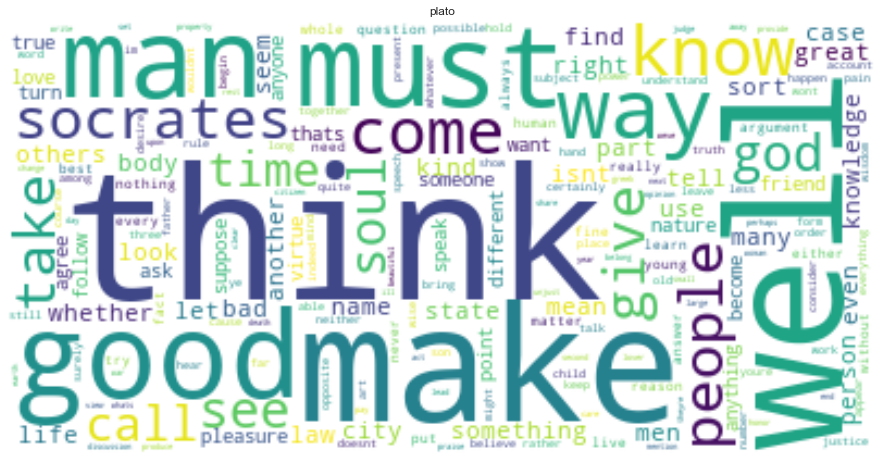

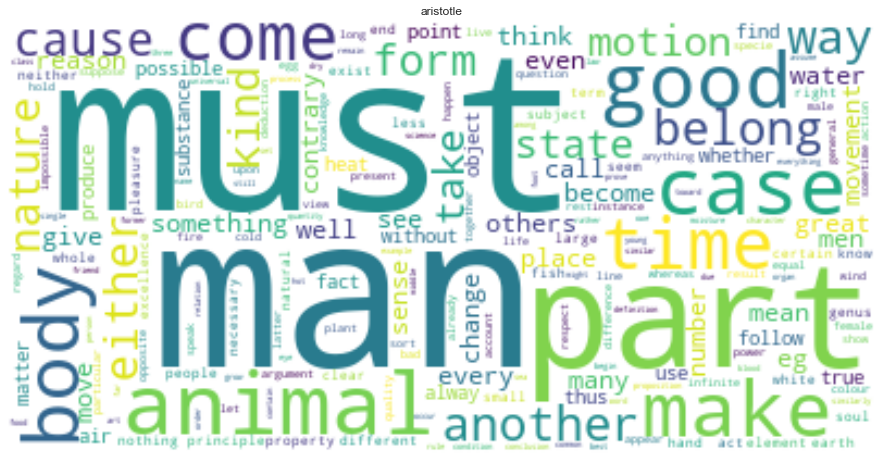

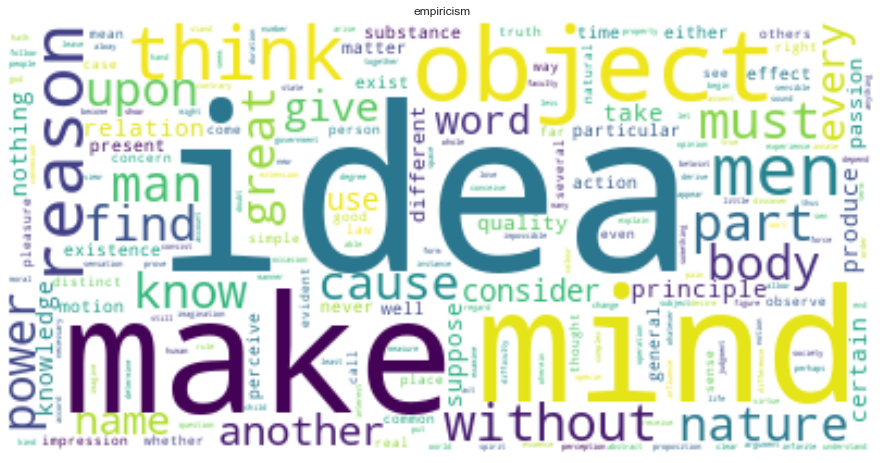

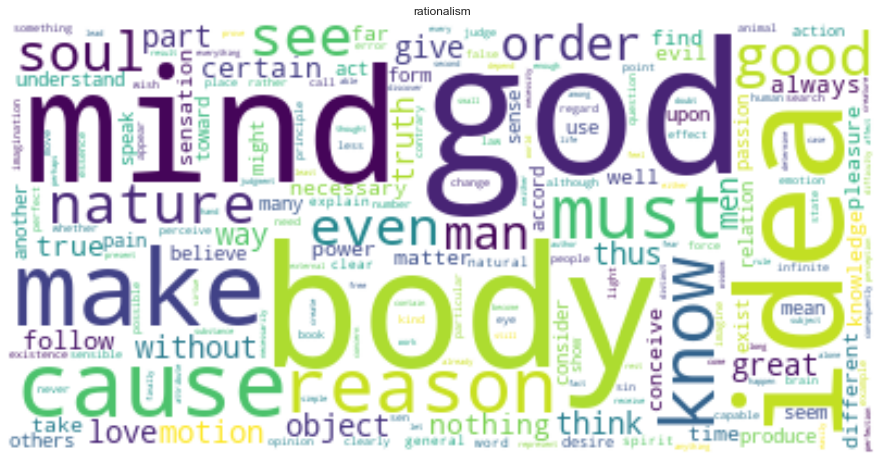

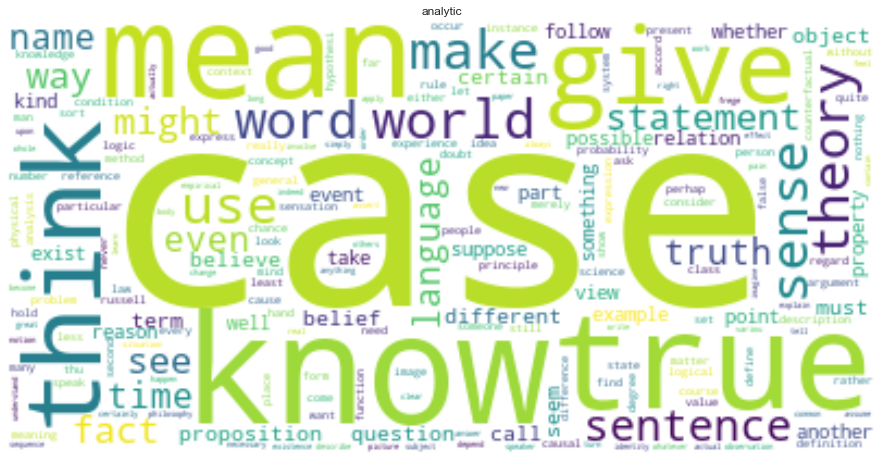

...

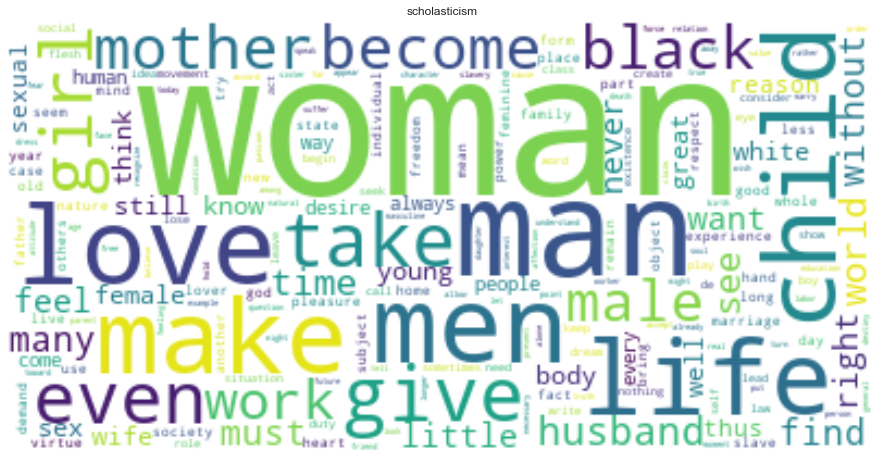

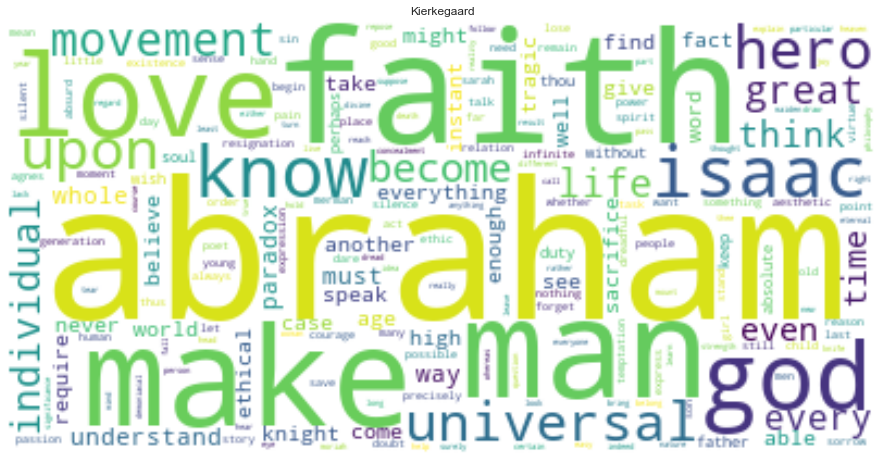

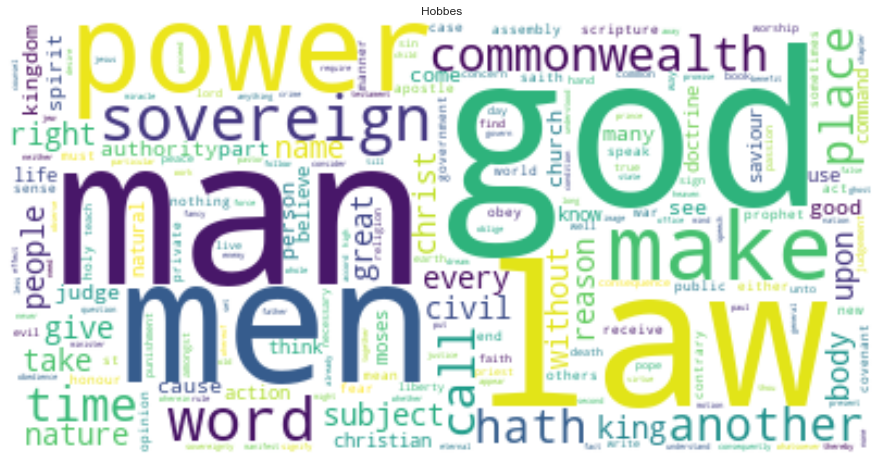

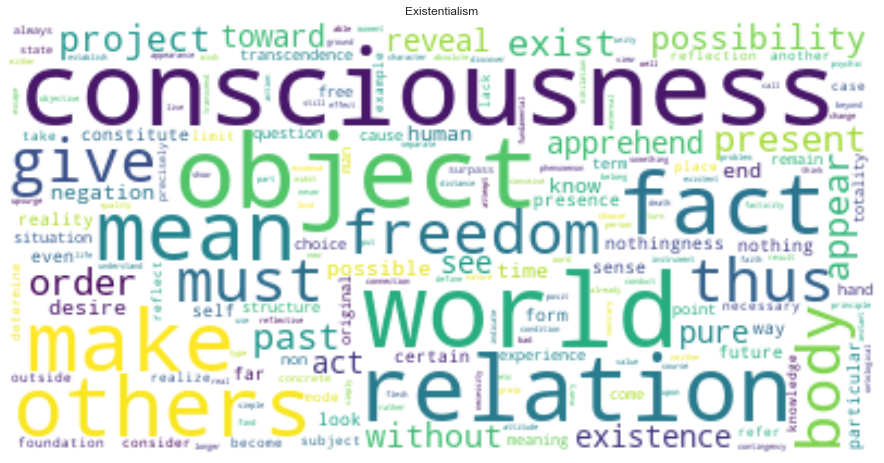

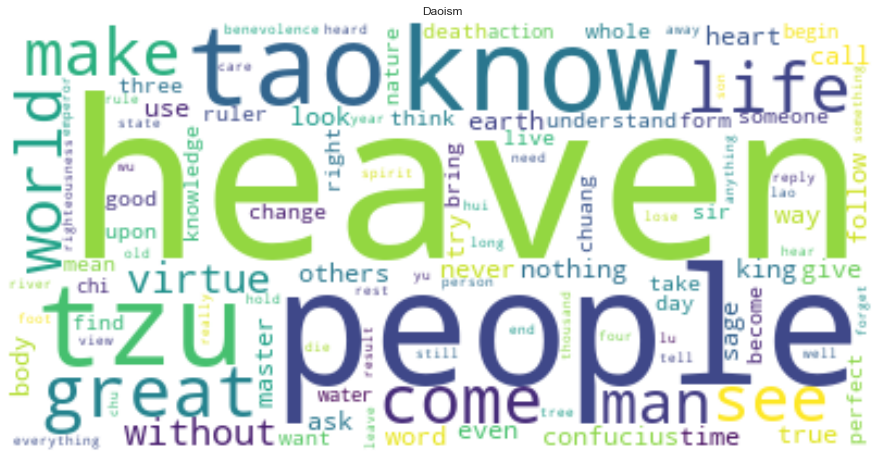

In [179]:
#display word clouds that show the main themes for each school based on term frequency
schools = dataset["school"].unique()
for school in schools:
    df_school = dataset[(dataset.school==school)]
    text = ' '.join(df_school['sentence_cleaned2'])
    word_cloud = WordCloud(collocations = False, background_color = 'white').generate(text)
    plt.imshow(word_cloud, interpolation='bilinear')
    plt.axis("off")
    fig = plt.figure(1, figsize=(0.25, 0.25))
    plt.title(school)
    plt.savefig(title+'png')
    plt.show()
    fullTermsDict = multidict.MultiDict()
    tmpDict = {}
    # making dict for counting frequencies manually in order to compare performance (optional)
    #for text2 in text.split(" "):
        #val = tmpDict.get(text, 0)
        #tmpDict[text2.lower()] = val + 1
    #for key in tmpDict:
        #fullTermsDict.add(key, tmpDict[key])
   # wc = WordCloud(background_color="white", max_words=1000)
    #wc.generate_from_frequencies(fullTermsDict)
    #plt.imshow(wc, interpolation="bilinear")
    #plt.axis("off")
    #plt.show()
    


# Topic Modeling using LDA


In [180]:
#we are going to concatenate the sentences in order to reconstruct the original books 
titles = dataset["title"].unique()
df = pd.DataFrame()
dic   = {}
for title in titles:
    df_title = dataset[(dataset.title==title)]
    text = ' '.join(df_title['sentence_cleaned2'])
    dic[title] = [text]
data = pd.DataFrame(data=dic)
#each row of our new dataset d is a book content indexed by the book name
d  = data.T

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [197]:
dataLDA = d[0].values.tolist()
st = stopwords.words('english')
st.append('must')
st.append('therefore')
st.append('could')
st.append('another')
vectorizer = CountVectorizer(strip_accents = 'unicode',
                                stop_words = st,
                                lowercase = True)
dtm_tf = vectorizer.fit_transform(dataLDA)
#experiment with different number of clusters
num_components=6
model=LatentDirichletAllocation(n_components=num_components, random_state=1)
lda_matrix = model.fit(dtm_tf)
lda_components=model.components_

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


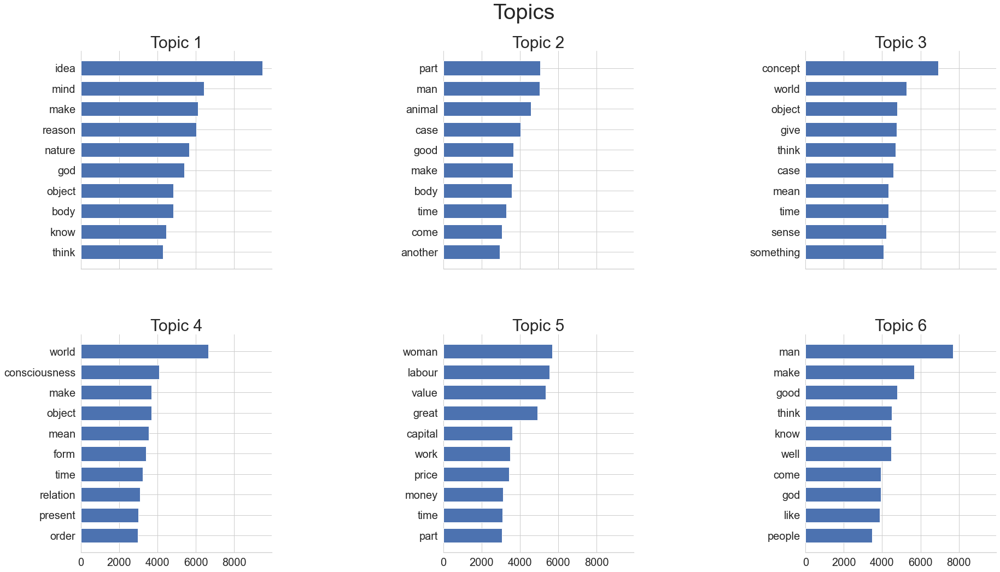

In [198]:
#visualization of outputs. Source: 
def plot_top_words2(model, feature_names, n_top_words, title):
    fig, axes = plt.subplots(2, 3, figsize=(20, 15), sharex=True)
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[: -n_top_words - 1 : -1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]
        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7)
        ax.set_title(f"Topic {topic_idx +1}", fontdict={"fontsize": 30})
        ax.invert_yaxis()
        ax.tick_params(axis="both", which="major", labelsize=20)
        for i in "top right left".split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=40)
    
    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.savefig('LDA topics')
    plt.show()
tf_feature_names = vectorizer.get_feature_names()
plot_top_words2(model, tf_feature_names, 10, "Topics")

In [199]:
#visualization of clusters
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(model, dtm_tf, vectorizer, mds='tsne')

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:691: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  warnings.warn(


PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
2       1.465019 -47.625065       1        1  20.096723
0      54.854797 -36.476795       2        1  18.278955
5      32.212929 -61.444572       3        1  16.598618
3       5.111096 -14.110332       4        1  15.585607
4      26.350170 -33.374702       5        1  14.732608
1      38.109818  -7.222781       6        1  14.707488, topic_info=            Term          Freq         Total Category  logprob  loglift
42078     labour   5519.000000   5519.000000  Default  30.0000  30.0000
35556       idea  12896.000000  12896.000000  Default  29.0000  29.0000
14123    concept   7838.000000   7838.000000  Default  28.0000  28.0000
86110      woman   7511.000000   7511.000000  Default  27.0000  27.0000
86269      world  15025.000000  15025.000000  Default  26.0000  26.0000
...          ...           ...           ...      ...      ...      ...
75252       take   2407.113587  15221.156151   Topic6  -5.6123   0.0726
76910  therefore   2293.708884  12670.482038   Topic6  -5.6605   0.2077
63401     reason   2299.183576  13892.077573   Topic6  -5.6581   0.1180
10149       call   2157.375316  11019.522901   Topic6  -5.7218   0.2860
31995      great   2148.237508  13679.624228   Topic6  -5.7260   0.0656

[600 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
15         2  0.958006        aaron
212        2  0.015431      abraham
212        3  0.938228      abraham
212        4  0.043208      abraham
212        5  0.003086      abraham
...      ...       ...          ...
86808      3  0.995248        youve
86822      3  0.993960           yu
86864      3  0.927103  zarathustra
86864      4  0.070354  zarathustra
86864      6  0.001563  zarathustra

[1835 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 6, 4, 5, 2])

In [244]:
#lets cluster the documents to most relevant topics
dic = dict(zip(dataset.title, dataset.school))
schools_for_each_pub = pd.DataFrame.from_dict(dic, orient='index')
doc_topic = model.transform(dtm_tf)
cluster = []
for n in range(doc_topic.shape[0]):
    topic_most_pr = doc_topic[n].argmax()
    #print("doc: {} topic: {}\n".format(n,topic_most_pr))
    cluster.append(topic_most_pr)
schools_for_each_pub['topic'] = cluster
schools_for_each_topic =  schools_for_each_pub.groupby(['topic',0]).size().reset_index(name='counts')


/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


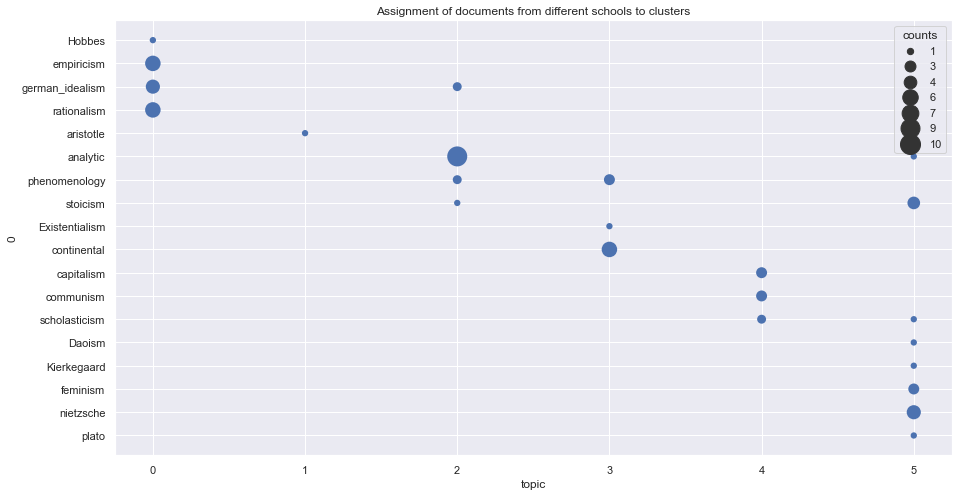

In [248]:
sns.set(rc = {'figure.figsize':(15,8)})
mean_df
sns.scatterplot(y=schools_for_each_topic[0], x=schools_for_each_topic['topic'],
                palette="ch:r=-.2,d=.3_r",
                sizes=(40, 400), linewidth=0 , size = schools_for_each_topic['counts']  )
plt.title('Assignment of documents from different schools to clusters')
plt.savefig('Assignment of documents  to clusters.png')
plt.show()


# Sentiment Analysis 

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-239-74b62593effa>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_of_interest['sentiment'] = data_of_interest['sentence_cleaned2'].apply(lambda s: te.get_emotion(s))
<ipython-input-239-74b62593effa>:12: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  datamean2  = data2.groupby("school")['Happy', '

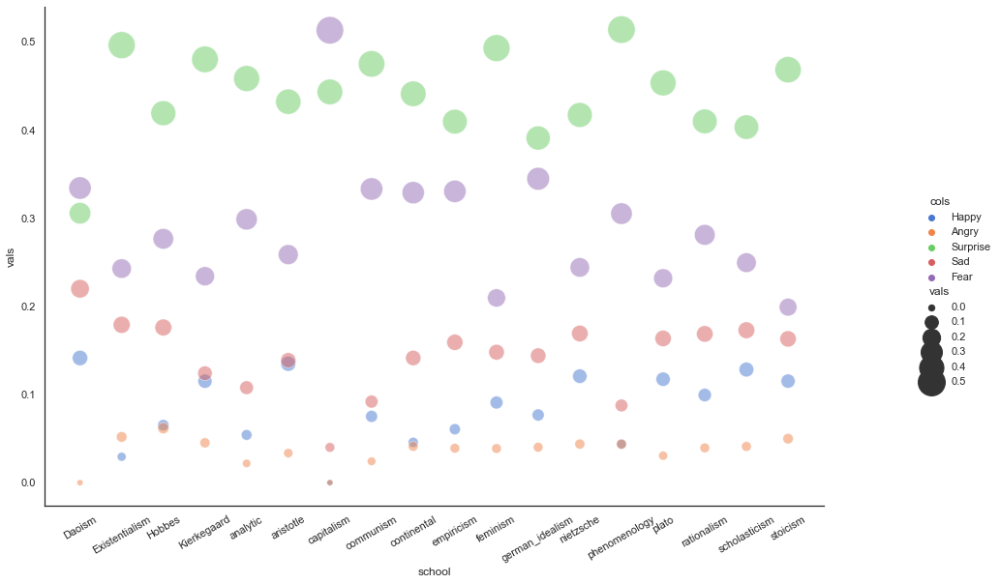

<ipython-input-239-74b62593effa>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_of_interest['sentiment'] = data_of_interest['sentence_cleaned2'].apply(lambda s: te.get_emotion(s))
<ipython-input-239-74b62593effa>:12: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  datamean2  = data2.groupby("school")['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' ].mean()


<Figure size 1584x576 with 0 Axes>

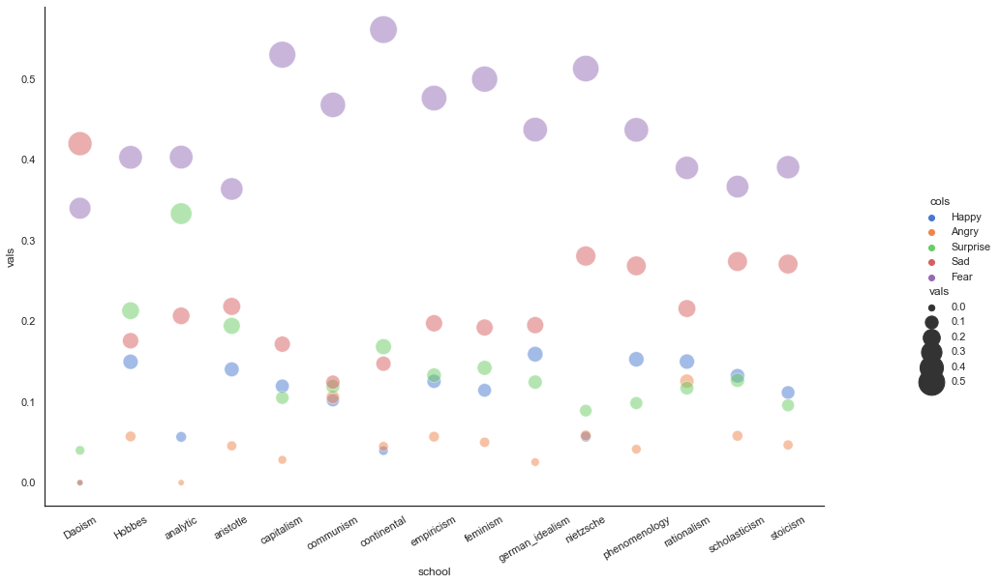

<ipython-input-239-74b62593effa>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_of_interest['sentiment'] = data_of_interest['sentence_cleaned2'].apply(lambda s: te.get_emotion(s))
<ipython-input-239-74b62593effa>:12: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  datamean2  = data2.groupby("school")['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' ].mean()


<Figure size 1584x576 with 0 Axes>

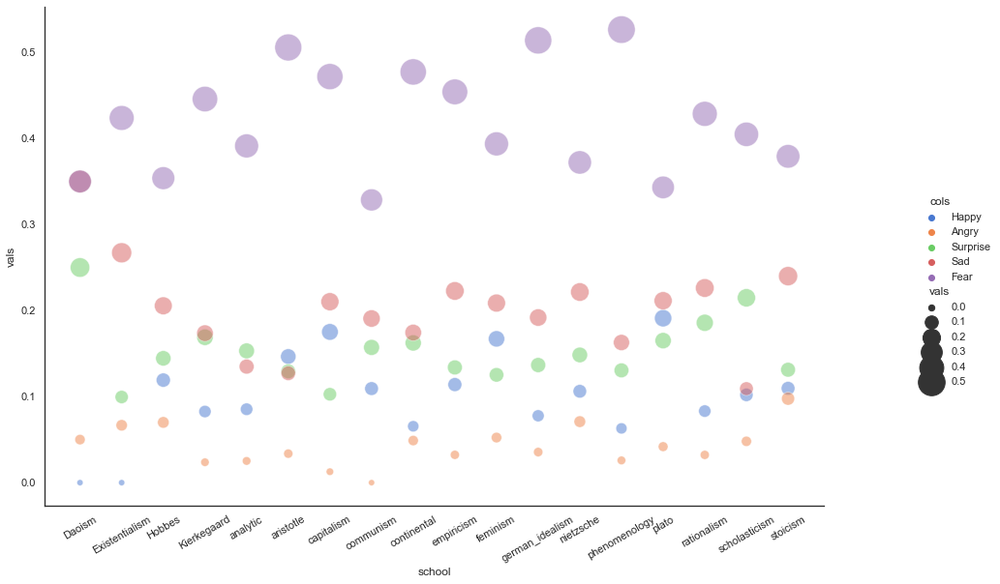

<ipython-input-239-74b62593effa>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_of_interest['sentiment'] = data_of_interest['sentence_cleaned2'].apply(lambda s: te.get_emotion(s))
<ipython-input-239-74b62593effa>:12: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  datamean2  = data2.groupby("school")['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' ].mean()


<Figure size 1584x576 with 0 Axes>

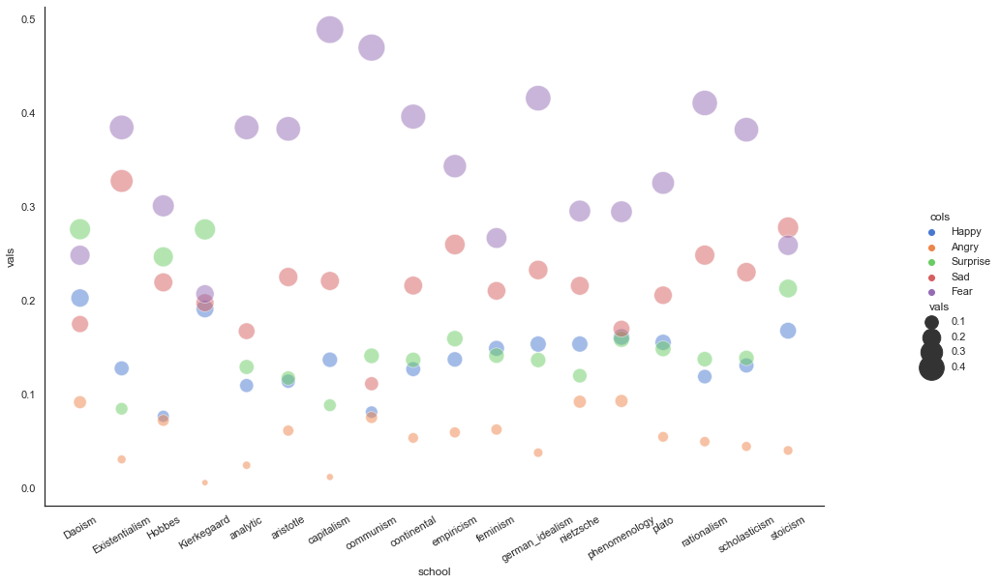

<ipython-input-239-74b62593effa>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_of_interest['sentiment'] = data_of_interest['sentence_cleaned2'].apply(lambda s: te.get_emotion(s))
<ipython-input-239-74b62593effa>:12: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  datamean2  = data2.groupby("school")['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' ].mean()


<Figure size 1584x576 with 0 Axes>

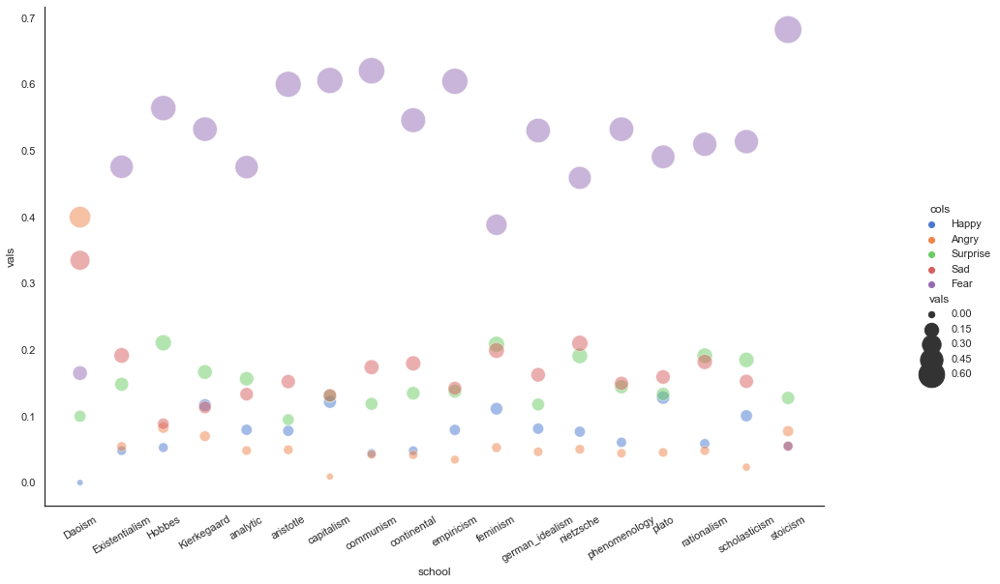

<ipython-input-239-74b62593effa>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_of_interest['sentiment'] = data_of_interest['sentence_cleaned2'].apply(lambda s: te.get_emotion(s))
<ipython-input-239-74b62593effa>:12: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  datamean2  = data2.groupby("school")['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' ].mean()


<Figure size 1584x576 with 0 Axes>

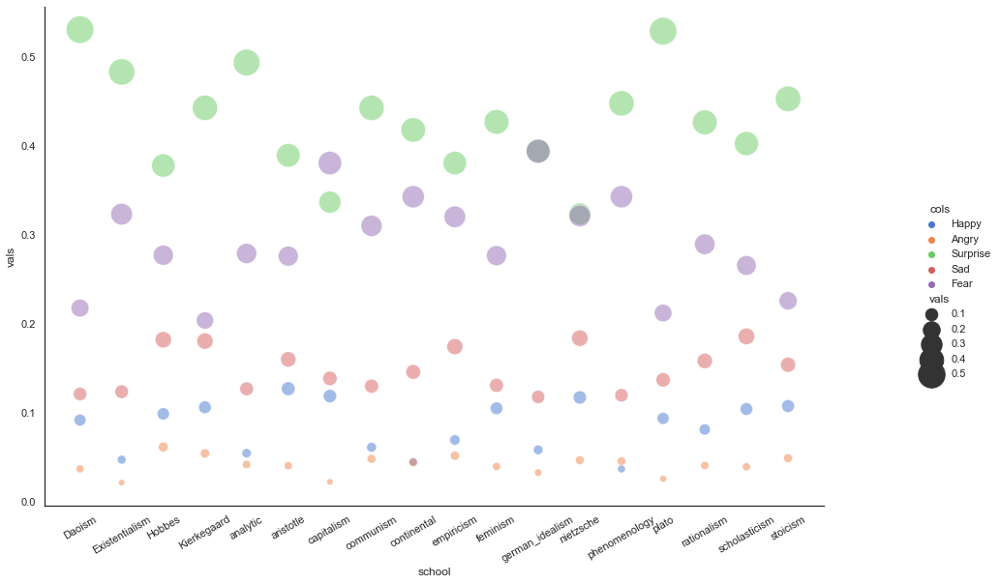

KeyboardInterrupt: 

<Figure size 1584x576 with 0 Axes>

In [239]:
#wdataset_sentiment = dataset
dataset_sentiment = dataset.loc[:,['school','author','title','sentence_cleaned2']]
words_of_interest = ['god', 'labour','philosophy','woman','concept','think','idea','world']
schools = dataset["school"].unique()
for word in words_of_interest:   
    dataset_sentiment = dataset.loc[:,['school','author','title','sentence_cleaned2']]
    dataset_sentiment['new'] = dataset_sentiment['sentence_cleaned2'].str.contains(word)
    data_of_interest =  dataset_sentiment[dataset_sentiment['new']== True ]
    data_of_interest['sentiment'] = data_of_interest['sentence_cleaned2'].apply(lambda s: te.get_emotion(s))
    data_of_interest = pd.concat([data_of_interest.drop(['sentiment'], axis=1), data_of_interest['sentiment'].apply(pd.Series)], axis=1)
    data2 = data_of_interest.loc[:,['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' , 'school']]
    datamean2  = data2.groupby("school")['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' ].mean()
    datamean2.reset_index(level=0, inplace=True)
    datamean2 = datamean2.melt('school', var_name='cols', value_name='vals')
    sns.set_theme(style="white") 
    g= sns.relplot(x="school", y="vals", hue="cols",
            sizes=(40, 800), alpha=.5, palette="muted", size = "vals",
            height=6, data=datamean2 , col_order=chronological_order,
)
    g.set_xticklabels(rotation=30)
    g.fig.set_size_inches(15,8)
    plt.title('Sentiment Analysis for word'+word)
    plt.show()
    plt.savefig(word+'_sentiment.png')



    
    
        

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-238-5a83e828039c>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  datamean2  = data2.groupby("school")['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' ].mean()


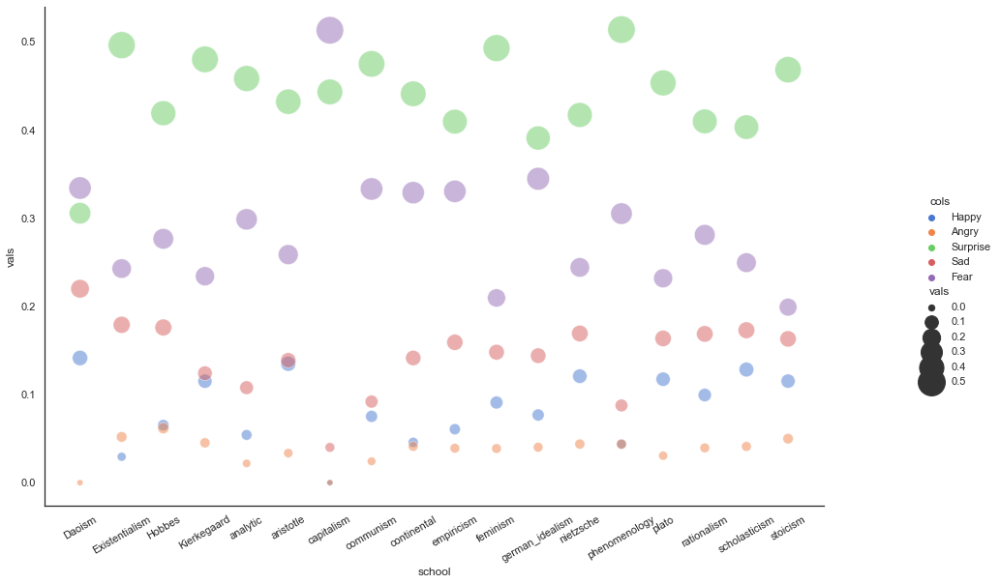

<Figure size 1584x576 with 0 Axes>

In [238]:
    datamean2  = data2.groupby("school")['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' ].mean()
    datamean2.reset_index(level=0, inplace=True)
    datamean2 = datamean2.melt('school', var_name='cols', value_name='vals')
    sns.set_theme(style="white") 
    g= sns.relplot(x="school", y="vals", hue="cols",
            sizes=(40, 800), alpha=.5, palette="muted", size = "vals",
            height=6, data=datamean2 , col_order=chronological_order,
)
    g.set_xticklabels(rotation=30)
    g.fig.set_size_inches(15,8)
    plt.show()
    plt.savefig(word+'_sentiment.png')
    

In [128]:
data_of_interest = pd.concat([data_of_interest.drop(['sentiment'], axis=1), data_of_interest['sentiment'].apply(pd.Series)], axis=1)
data_of_interest

,school,author,title,sentence_cleaned2,new,Happy,Angry,Surprise,Sad,Fear
21,plato,Plato,Plato - Complete Works,strange hear tell maker god ground create new ...,True,0.00,0.0,0.60,0.40,0.00
59,plato,Plato,Plato - Complete Works,indeed important admirable euthyphro become pu...,True,0.56,0.0,0.11,0.22,0.11
65,plato,Plato,Plato - Complete Works,know people well meletus even seem notice wher...,True,0.00,0.0,0.00,0.50,0.50
67,plato,Plato,Plato - Complete Works,kind godliness ungodliness regard murder pious...,True,0.50,0.0,0.00,0.25,0.25
72,plato,Plato,Plato - Complete Works,already others action right favor ungodly whoever,True,0.25,0.0,0.25,0.00,0.50
...,...,...,...,...,...,...,...,...,...,...
391493,Daoism,Zhuangzi,The Book of Zhuangzi,give divinity spirit god,True,0.00,0.0,0.25,0.25,0.50
391746,Daoism,Zhuangzi,The Book of Zhuangzi,could foretell people die bear knew good fortu...,True,0.40,0.0,0.20,0.30,0.10
393090,Daoism,Zhuangzi,The Book of Zhuangzi,shook head lord yellow river look confront jo ...,True,0.14,0.0,0.29,0.29,0.29
393189,Daoism,Zhuangzi,The Book of Zhuangzi,gentle gentle like local earth god offering ma...,True,0.20,0.0,0.40,0.20,0.20


In [234]:


chronological_order = [['plato'],
 ['aristotle'],
 ['Daoism'],
 ['stoicism'],
 ['scholasticism'],
 ['Hobbes'],
 ['rationalism'],
 ['empiricism'],
 ['german_idealism'],
 ['capitalism'],
 ['Kierkegaard'],
 ['communism'],
 ['nietzsche'],
 ['phenomenology'],
 ['Existentialism'],
 ['feminism'],
 ['analytic'],
 ['continental']]       
        

/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


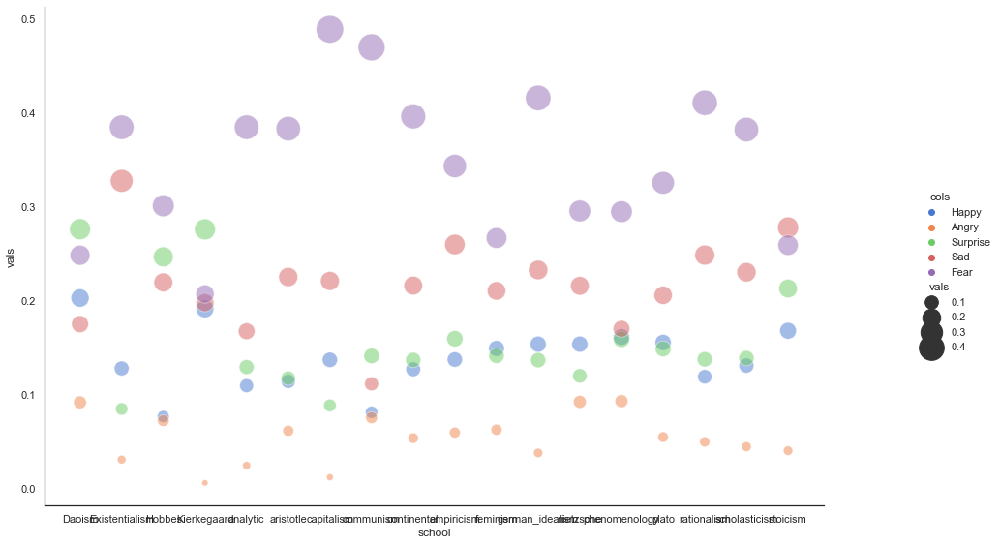

In [150]:
sns.set_theme(style="white")

# Load the example mpg dataset
mpg = sns.load_dataset("mpg")

# Plot miles per gallon against horsepower with other semantics
g= sns.relplot(x="school", y="vals", hue="cols",
            sizes=(40, 800), alpha=.5, palette="muted", size = "vals",
            height=6, data=datamean2)
g.fig.set_size_inches(15,8)


In [144]:
dataset_sentiment = dataset
dataset_sentiment = dataset.loc[:,['school','author','title','sentence_cleaned2']]
words_of_interest = ['woman']#, 'labour','philosophy','mind']
schools = dataset["school"].unique()
for word in words_of_interest:   
    dataset_sentiment['new'] = dataset_sentiment['sentence_cleaned2'].str.contains(word)
    data_of_interest =  dataset_sentiment[dataset_sentiment['new']== True ]
    data_of_interest['sentiment'] = data_of_interest['sentence_cleaned2'].apply(lambda s: te.get_emotion(s))

data_of_interest = pd.concat([data_of_interest.drop(['sentiment'], axis=1), data_of_interest['sentiment'].apply(pd.Series)], axis=1)
data_of_interest

<ipython-input-144-ca75e13e50ee>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_of_interest['sentiment'] = data_of_interest['sentence_cleaned2'].apply(lambda s: te.get_emotion(s))


/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-203-b98c8147e754>:6: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  datamean2 = mean_df = data_of_interest.groupby("school")['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' ].mean()


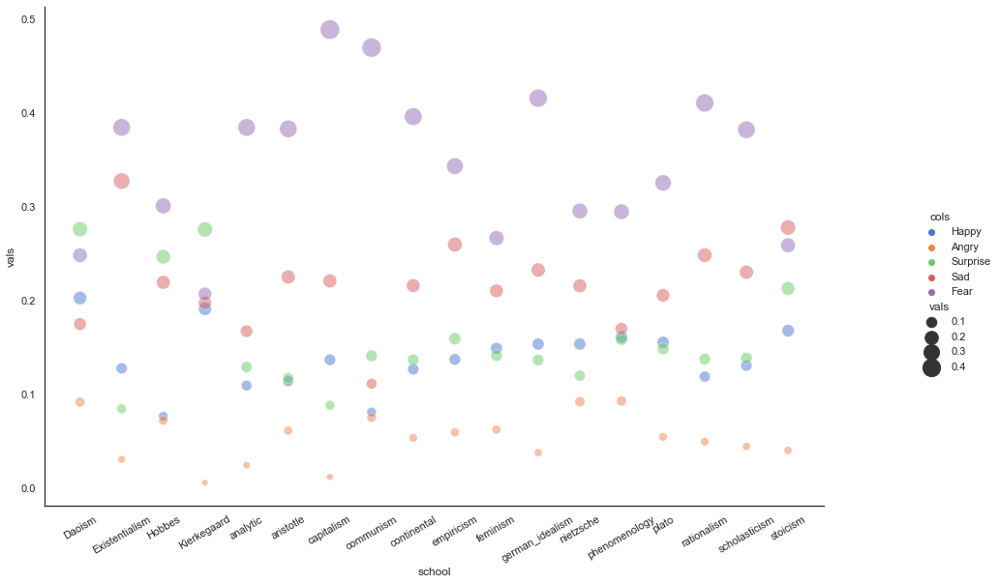

In [203]:

keys=['Happy', 'Angry', 'Surprise', 'Sad', 'Fear','sc']
keys2=['Happy', 'Angry', 'Surprise', 'Sad', 'Fear']


data2 = data_of_interest.loc[:,['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' , 'school']]
datamean2 = mean_df = data_of_interest.groupby("school")['Happy', 'Angry', 'Surprise', 'Sad', 'Fear' ].mean()
datamean2.reset_index(level=0, inplace=True)

datamean2 = datamean2.melt('school', var_name='cols', value_name='vals')


datamean2
        
sns.set_theme(style="white")

# Plot miles per gallon against horsepower with other semantics
g= sns.relplot(x="school", y="vals", hue="cols",
            sizes=(40, 400), alpha=.5, palette="muted", size = "vals",
            height=6, data=datamean2)
g.set_xticklabels(rotation=30)

g.fig.set_size_inches(15,8)

